# Food Item Detection Using Resnet-50 #

In [71]:
import matplotlib.pyplot as plt
import matplotlib.image as img
%matplotlib inline
import numpy as np
from collections import defaultdict
import collections
import os

# Import necessary PyTorch libraries
import torch
from torch import nn
from torch import optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models
import numpy as np

In [72]:
# Helper function to download data and extract
import os
def get_data():
  if "food-101" in os.listdir():
    print("Dataset already exists")
  else:
    print("Downloading the data...")
    !wget http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
    print("Dataset downloaded!")
    print("Extracting data..")
    !tar xzvf food-101.tar.gz
    print("Extraction done!")

get_data()

Dataset already exists


In [73]:
# Helper method to split dataset into train and test folders
from shutil import copy
def prepare_data(filepath, src, dest):
  classes_images = defaultdict(list)
  with open(filepath, 'r') as txt:
      paths = [read.strip() for read in txt.readlines()]
      for p in paths:
        food = p.split('/')
        classes_images[food[0]].append(food[1] + '.jpg')

  for food in classes_images.keys():
    print("\nCopying images into ",food)
    if not os.path.exists(os.path.join(dest,food)):
      os.makedirs(os.path.join(dest,food))
    for i in classes_images[food]:
      copy(os.path.join(src,food,i), os.path.join(dest,food,i))
  print("Copying Done!")

# Prepare train dataset by copying images from food-101/images to food-101/train using the file train.txt
# print("Creating train data...")
# prepare_data('food-101/meta/train.txt', 'food-101/images', 'food-101/train')

# Prepare test data by copying images from food-101/images to food-101/test using the file test.txt
# print("Creating test data...")
# prepare_data('food-101/meta/test.txt', 'food-101/images', 'food-101/test')

In [74]:
#List of Food items that we will be training the model for
food_items = ["omelette", "macarons", "macaroni_and_cheese", "samosa", "cup_cakes", "pizza", "donuts", "prime_rib", "hot_dog", "caesar_salad"]
# print(len(food_items))

#Override find_classes of the datasets class to only include
#the 10 categories of food items we are interested in

#Override find_classes 
def find_classes(self, directory: str):
    # 1. Get the class names by scanning the target directory
    classes = sorted(entry for entry in food_items if(os.path.isdir(os.path.join(directory, entry))))

    # 2. Raise an error if class names not found
    if not classes:
        raise FileNotFoundError(f"Couldn't find any classes in {directory}.")

    # 3. Create a dictionary of index labels (computers prefer numerical rather than string labels)
    class_to_idx = {cls_name: i for i, cls_name in enumerate(classes)}
    return classes, class_to_idx

datasets.ImageFolder._find_classes = find_classes

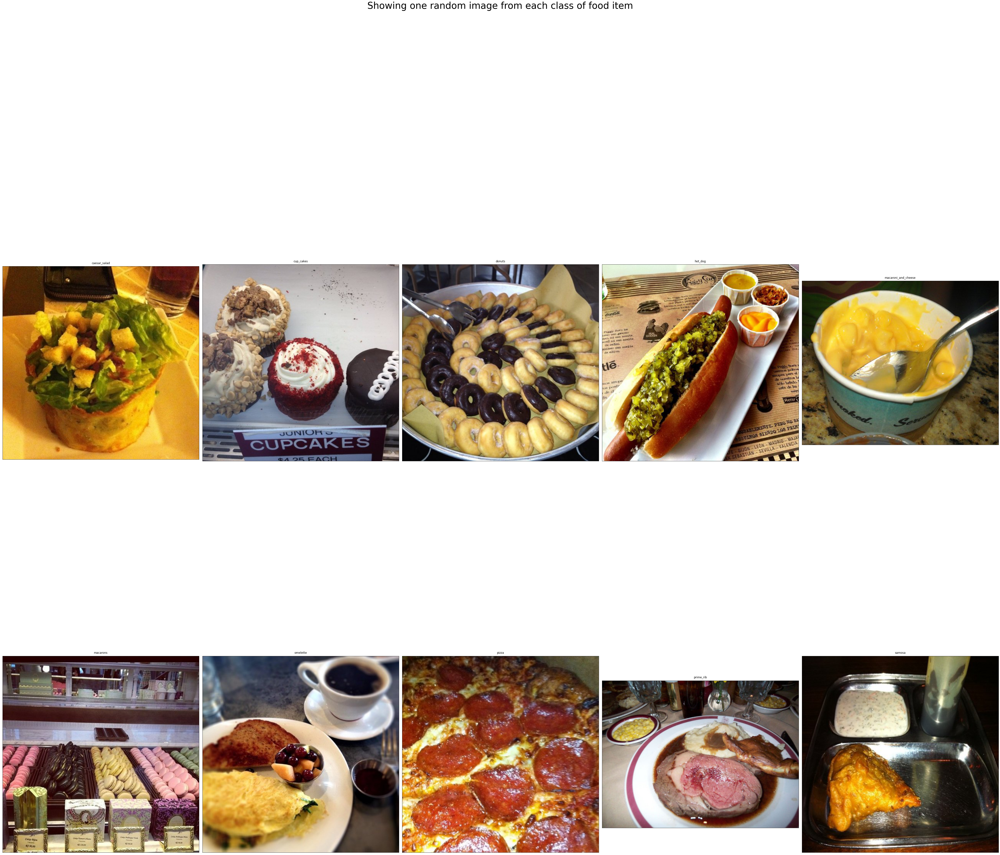

In [5]:
# Visualize the data, showing one image per class from 101 classes
rows = 2
cols = 5
fig, ax = plt.subplots(rows, cols, figsize=(60,60))
fig.suptitle("Showing one random image from each class of food item", y=1.05, fontsize=40)
data_dir = "food-101/images/"
foods_sorted = sorted(food_items)
food_id = 0
for i in range(rows):
  for j in range(cols):
    try:
      food_selected = foods_sorted[food_id] 
      food_id += 1
    except:
      break
    food_selected_images = os.listdir(os.path.join(data_dir,food_selected))
    food_selected_random = np.random.choice(food_selected_images)
    img = plt.imread(os.path.join(data_dir,food_selected, food_selected_random))
    ax[i][j].imshow(img)
    #print(img.shape)
    ax[i][j].set_title(food_selected, pad = 10)
    
plt.setp(ax, xticks=[],yticks=[])
plt.tight_layout()

In [75]:
# Check whether GPU is available and if it is then use GPU
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')

CUDA is available!  Training on GPU ...


In [76]:
# Data augmentation
train_transforms = transforms.Compose([transforms.RandomResizedCrop(224),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.RandomRotation(45),
                                       transforms.ColorJitter(),
                                       transforms.ToTensor(),
                                       transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                            std=[0.229, 0.224, 0.225])])

# Use 5-crop for Test Time Augmentation
test_transforms = transforms.Compose([transforms.Resize(256),
                                      transforms.FiveCrop(224),
                                      transforms.Lambda(lambda crops: torch.stack([transforms.ToTensor()(crop) for crop in crops])),
                                      transforms.Lambda(lambda crops: torch.stack([transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])(crop) for crop in crops]))])

# Load the datasets with ImageFolder
train_data = datasets.ImageFolder("food-101/train", transform=train_transforms)
test_data = datasets.ImageFolder("food-101/test", transform=test_transforms)

# Using the image datasets and the tranforms, define the dataloaders
train_loader = torch.utils.data.DataLoader(train_data, batch_size = 64, shuffle = True)
test_loader = torch.utils.data.DataLoader(test_data, batch_size= 64, shuffle = True)

In [77]:
# print out some data stats
print('Number of training images: ', len(train_data))
print('Number of testing images: ', len(test_data))

# Analyzing the shape of one batch
train_images, train_labels = next(iter(train_loader))
test_images, test_labels = next(iter(test_loader))

print('Shape of first batch of training images: ', train_images.shape)
print('Shape of first batch of test images: ', test_images.shape) # 5-D array because of 10 crops
print(train_data.class_to_idx)

Number of training images:  7500
Number of testing images:  2500
Shape of first batch of training images:  torch.Size([64, 3, 224, 224])
Shape of first batch of test images:  torch.Size([64, 5, 3, 224, 224])
{'caesar_salad': 0, 'cup_cakes': 1, 'donuts': 2, 'hot_dog': 3, 'macaroni_and_cheese': 4, 'macarons': 5, 'omelette': 6, 'pizza': 7, 'prime_rib': 8, 'samosa': 9}


In [78]:
# Load the ResNet-50 model pretrained on ImageNet 
model = models.resnet50(pretrained=True)
print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [79]:
# Freeze the initial layers
for param in model.parameters():
  param.requies_grad = False
  
# Replace the final fully connected layer with new fully connected layer (randomly initialized weights)
# that outputs 101 units (based on our dataset)
classifier = nn.Linear(2048, 101)
model.fc = classifier
print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

## Training Only the Initial Layer ##

- Here we train the initial layer using the pre-trained weights from ImageNet

- The model is trained for 15 epochs 


In [80]:
# specify loss function (categorical cross-entropy)
criterion = nn.CrossEntropyLoss()

# specify optimizer (stochastic gradient descent with momentum)
optimizer = optim.SGD(model.fc.parameters(), lr=0.02, momentum=0.9)

# specify learning rate scheduler (if there is no further decrease in loss for next 3 epochs 
# then lower the learning rate)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience = 3)

In [13]:
# Move the model to GPU if CUDA is available
if train_on_gpu:
    model.cuda()

# number of epochs to train the model
n_epochs = 15

valid_loss_min = np.Inf # track change in validation loss

for epoch in range(1, n_epochs+1):
    # keep track of training and validation loss
    train_loss = 0.0
    train_accuracy = 0.0
    valid_loss = 0.0
    val_accuracy = 0.0
    
    ###################
    # train the model #
    ###################
    model.train()
    count = 0
    for data, target in train_loader:
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        loss = criterion(output, target)
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss
        train_loss += loss.item()*data.size(0)
        # Calculate training accuracy
        top_p, top_class = output.topk(1, dim=1)
        equals = top_class == target.view(*top_class.shape)
        train_accuracy += torch.mean(equals.type(torch.FloatTensor)).item()*data.size(0)
        count+=1
        if(count%10)==0:
            print("Training loader count ", count)
    
    print("Training complete for epoch ", epoch)
    
    ######################    
    # validate the model #
    ######################
    model.eval()
    count = 0
    with torch.no_grad():
        for data, target in test_loader:
            # move tensors to GPU if CUDA is available
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()
            
            ## For 5-crop Testing
            input_var = torch.autograd.Variable(data)
            target_var = torch.autograd.Variable(target)
            bs, ncrops, c, h, w = input_var.size()
            # forward pass: compute predicted outputs by passing inputs to the model
            temp_output = model(input_var.view(-1, c, h, w))
            output = temp_output.view(bs, ncrops, -1).mean(1)
            # calculate the batch loss
            loss = criterion(output, target_var)
            # update average validation loss 
            valid_loss += loss.item()*data.size(0)
            # Calculate validation accuracy
            top_p, top_class = output.topk(1, dim=1)
            equals = top_class == target.view(*top_class.shape)
            val_accuracy += torch.mean(equals.type(torch.FloatTensor)).item()*data.size(0)
            count+=1
            if(count%10)==0:
                print("Validation loader count ", count)
            
    print("Validation complete for epoch ", epoch)
    
    # calculate average losses and accuracies
    train_loss = train_loss/len(train_loader.dataset)
    train_accuracy = train_accuracy/len(train_loader.dataset)
    valid_loss = valid_loss/len(test_loader.dataset)
    val_accuracy = val_accuracy/len(test_loader.dataset)
    # Learning rate scheduler step
    scheduler.step(valid_loss) 
    
    # print training/validation statistics 
    print('Epoch: {} \tTraining Loss: {:.4f} \tTraining Accuracy: {:.4f} \tValidation Loss: {:.4f} \tValidation Accuracy: {:.4f}'.format(
        epoch, train_loss, train_accuracy, valid_loss, val_accuracy))
    
    # save model if validation loss has decreased
    if valid_loss <= valid_loss_min:
        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(valid_loss_min, valid_loss))
        
        checkpoint = {"model": model,
                      "criterion": criterion,
                      "epochs": epoch,
                      "optimizer_state": optimizer.state_dict(),
                      "model_state": model.state_dict(),
                      "valid_loss_min": valid_loss}
        
        # save model
        torch.save(checkpoint, 'res50model.pth')
        valid_loss_min = valid_loss

Training loader count  10
Training loader count  20
Training loader count  30
Training loader count  40
Training loader count  50
Training loader count  60
Training loader count  70
Training loader count  80
Training loader count  90
Training loader count  100
Training loader count  110
Training complete for epoch  1
Validation loader count  10
Validation loader count  20
Validation loader count  30
Validation loader count  40
Validation complete for epoch  1
Epoch: 1 	Training Loss: 1.2769 	Training Accuracy: 0.5972 	Validation Loss: 0.7264 	Validation Accuracy: 0.7548
Validation loss decreased (inf --> 0.726385).  Saving model ...
Training loader count  10
Training loader count  20
Training loader count  30
Training loader count  40
Training loader count  50
Training loader count  60
Training loader count  70
Training loader count  80
Training loader count  90
Training loader count  100
Training loader count  110
Training complete for epoch  2
Validation loader count  10
Validation l

In [81]:
# Resume training in case the training is interrupted
# Load the saved model from last checkpoint
checkpoint = torch.load("res50model.pth", map_location='cpu')

# Use the same architecture as used earlier
model = models.resnet50(pretrained=False)
for param in model.parameters():
  param.requires_grad = False

    
classifier = nn.Linear(2048, 101)
model.fc = classifier

model.load_state_dict(checkpoint['model_state'], strict=False)

# specify loss function (categorical cross-entropy) same as used earlier
criterion = nn.CrossEntropyLoss()

# specify optimizer same as used earlier
optimizer = optim.SGD(model.fc.parameters(), lr=0.01, momentum=0.9)

# secify scheduler same as used earlier
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience = 5)

# Check the saved model's last epoch and last validation loss
valid_loss = checkpoint["valid_loss_min"] 
num_epoch = checkpoint['epochs']

In [82]:
print(num_epoch)
print(valid_loss)

15
0.3017120858669281


In [83]:
# Resume training in case the training is interrupted
# Move the model to GPU if CUDA is available
if train_on_gpu:
    model.cuda()

# number of epochs to train the model
n_epochs = 15

valid_loss_min = valid_loss # track change in validation loss

for epoch in range(num_epoch+1, n_epochs+1):
    # keep track of training and validation loss
    train_loss = 0.0
    train_accuracy = 0.0
    valid_loss = 0.0
    val_accuracy = 0.0
    
    ###################
    # train the model #
    ###################
    model.train()
    count = 0
    for data, target in train_loader:
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        loss = criterion(output, target)
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss
        train_loss += loss.item()*data.size(0)
        # Calculate training accuracy
        top_p, top_class = output.topk(1, dim=1)
        equals = top_class == target.view(*top_class.shape)
        train_accuracy += torch.mean(equals.type(torch.FloatTensor)).item()*data.size(0)
        count+=1
        if(count%10)==0:
            print("Training loader count ", count)
    
    print("Training complete for epoch ", epoch)
        
    ######################    
    # validate the model #
    ######################
    model.eval()
    with torch.no_grad():
        count = 0
        for data, target in test_loader:
            # move tensors to GPU if CUDA is available
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()
            
            ## For 10-crop Testing
            input_var = torch.autograd.Variable(data)
            target_var = torch.autograd.Variable(target)
            bs, ncrops, c, h, w = input_var.size()
            # forward pass: compute predicted outputs by passing inputs to the model
            temp_output = model(input_var.view(-1, c, h, w))
            output = temp_output.view(bs, ncrops, -1).mean(1)
            # calculate the batch loss
            loss = criterion(output, target_var)
            # update average validation loss 
            valid_loss += loss.item()*data.size(0)
            # Calculate validation accuracy
            top_p, top_class = output.topk(1, dim=1)
            equals = top_class == target.view(*top_class.shape)
            val_accuracy += torch.mean(equals.type(torch.FloatTensor)).item()*data.size(0)
            count+=1
            if(count%10)==0:
                print("Validation loader count ", count)
            
    print("Validation complete for epoch ", epoch)
    
    # calculate average losses
    train_loss = train_loss/len(train_loader.dataset)
    train_accuracy = train_accuracy/len(train_loader.dataset)
    valid_loss = valid_loss/len(test_loader.dataset)
    val_accuracy = val_accuracy/len(test_loader.dataset)
    scheduler.step(valid_loss)
    
    # print training/validation statistics 
    print('Epoch: {} \tTraining Loss: {:.4f} \tTraining Accuracy: {:.4f} \tValidation Loss: {:.4f} \tValidation Accuracy: {:.4f}'.format(
        epoch, train_loss, train_accuracy, valid_loss, val_accuracy))
    
    # save model if validation loss has decreased
    if valid_loss <= valid_loss_min:
        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(valid_loss_min, valid_loss))
        
        checkpoint = {"model": model,
                      "criterion": criterion,
                      "epochs": epoch,
                      "optimizer_state": optimizer.state_dict(),
                      "model_state": model.state_dict(),
                      "valid_loss_min": valid_loss}
        
        # Save model
        torch.save(checkpoint, 'res50model.pth')
        valid_loss_min = valid_loss

## Training the entire network ##

- We first unfreeze the previous layers
- We use the weights obtained for the final layer for this stage of training
- We train for 30 epochs to achieve > 94% validation accuracy

In [84]:
# Load the saved model from last checkpoint
checkpoint = torch.load("./res50model.pth", map_location='cpu')

# Use entire network for training
model = models.resnet50(pretrained=False)
# for param in model.parameters():
#   param.requires_grad = False

    
classifier = nn.Linear(2048, 101)
model.fc = classifier

model.load_state_dict(checkpoint['model_state'], strict=False)

# specify loss function (categorical cross-entropy) same as used earlier
criterion = nn.CrossEntropyLoss()

# specify optimizer same as used earlier
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

# secify scheduler same as used earlier
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience = 5)

# Check the saved model's last epoch and last validation loss
valid_loss = checkpoint["valid_loss_min"] 
num_epoch = checkpoint['epochs']

In [85]:
print(num_epoch)
print(valid_loss)

15
0.3017120858669281


In [20]:
# Move the model to GPU if CUDA is available
if train_on_gpu:
    model.cuda()

# number of epochs to train the model 
n_epochs = 30  # new number of epochs

valid_loss_min = valid_loss # track change in validation loss

for epoch in range(num_epoch+1, n_epochs+1):
    # keep track of training and validation loss
    train_loss = 0.0
    train_accuracy = 0.0
    valid_loss = 0.0
    val_accuracy = 0.0
    
    ###################
    # train the model #
    ###################
    model.train()
    count = 0
    for data, target in train_loader:
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        loss = criterion(output, target)
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss
        train_loss += loss.item()*data.size(0)
        # Calculate training accuracy
        top_p, top_class = output.topk(1, dim=1)
        equals = top_class == target.view(*top_class.shape)
        train_accuracy += torch.mean(equals.type(torch.FloatTensor)).item()*data.size(0)
        count+=1
        if((count%10)==0):
            print("Training iter in epoch: ", count)
            
    print("Training complete for epoch ", epoch)
        
        
    ######################    
    # validate the model #
    ######################
    model.eval()
    with torch.no_grad():
        count = 0
        for data, target in test_loader:
            # move tensors to GPU if CUDA is available
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()
            
            ## For 5-crop Testing
            input_var = torch.autograd.Variable(data)
            target_var = torch.autograd.Variable(target)
            bs, ncrops, c, h, w = input_var.size()
            # forward pass: compute predicted outputs by passing inputs to the model
            temp_output = model(input_var.view(-1, c, h, w))
            output = temp_output.view(bs, ncrops, -1).mean(1)
            # calculate the batch loss
            loss = criterion(output, target_var)
            # update average validation loss 
            valid_loss += loss.item()*data.size(0)
            # Calculate validation accuracy
            top_p, top_class = output.topk(1, dim=1)
            equals = top_class == target.view(*top_class.shape)
            val_accuracy += torch.mean(equals.type(torch.FloatTensor)).item()*data.size(0)
            count+=1
            if((count%10)==0):
                print("Validation iter in epoch: ", count)
            
    print("Validation complete for epoch ", epoch)
    
    # calculate average losses
    train_loss = train_loss/len(train_loader.dataset)
    train_accuracy = train_accuracy/len(train_loader.dataset)
    valid_loss = valid_loss/len(test_loader.dataset)
    val_accuracy = val_accuracy/len(test_loader.dataset)
    scheduler.step(valid_loss)
    
    # print training/validation statistics 
    print('Epoch: {} \tTraining Loss: {:.4f} \tTraining Accuracy: {:.4f} \tValidation Loss: {:.4f} \tValidation Accuracy: {:.4f}'.format(
        epoch, train_loss, train_accuracy, valid_loss, val_accuracy))
    
    # save model if validation loss has decreased
    if valid_loss <= valid_loss_min:
        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(valid_loss_min, valid_loss))
        
        checkpoint = {"model": model,
                      "criterion": criterion,
                      "epochs": epoch,
                      "optimizer_state": optimizer.state_dict(),
                      "model_state": model.state_dict(),
                      "valid_loss_min": valid_loss}
        
        # Save model
    
        torch.save(checkpoint, 'res50model-final.pth')
        valid_loss_min = valid_loss

Training iter in epoch:  10
Training iter in epoch:  20
Training iter in epoch:  30
Training iter in epoch:  40
Training iter in epoch:  50
Training iter in epoch:  60
Training iter in epoch:  70
Training iter in epoch:  80
Training iter in epoch:  90
Training iter in epoch:  100
Training iter in epoch:  110
Training complete for epoch  16
Validation iter in epoch:  10
Validation iter in epoch:  20
Validation iter in epoch:  30
Validation iter in epoch:  40
Validation complete for epoch  16
Epoch: 16 	Training Loss: 1.3128 	Training Accuracy: 0.6025 	Validation Loss: 0.5550 	Validation Accuracy: 0.8140
Training iter in epoch:  10
Training iter in epoch:  20
Training iter in epoch:  30
Training iter in epoch:  40
Training iter in epoch:  50
Training iter in epoch:  60
Training iter in epoch:  70
Training iter in epoch:  80
Training iter in epoch:  90
Training iter in epoch:  100
Training iter in epoch:  110
Training complete for epoch  17
Validation iter in epoch:  10
Validation iter in

In [86]:
# Resume training in case the training is interrupted
# Load the saved model from last checkpoint
checkpoint = torch.load("res50model-final.pth", map_location='cpu')

# Use entire network for training
model = models.resnet50(pretrained=False)
    
classifier = nn.Linear(2048, 101)
model.fc = classifier

model.load_state_dict(checkpoint['model_state'], strict=False)

# specify loss function (categorical cross-entropy) same as used earlier
criterion = nn.CrossEntropyLoss()

# specify optimizer same as used earlier
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.9)

# secify scheduler same as used earlier
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience = 5)

# Check the saved model's last epoch and last validation loss
valid_loss = checkpoint["valid_loss_min"] 
num_epoch = checkpoint['epochs']

In [87]:
print(num_epoch)
print(valid_loss)

30
0.12431517592221498


In [88]:
# Resume training in case the training is interrupted
# Move the model to GPU if CUDA is available
if train_on_gpu:
    model.cuda()

# number of epochs to train the model 
n_epochs = 30

valid_loss_min = valid_loss # track change in validation loss

for epoch in range(num_epoch+1, n_epochs+1):
    # keep track of training and validation loss
    train_loss = 0.0
    train_accuracy = 0.0
    valid_loss = 0.0
    val_accuracy = 0.0
    
    ###################
    # train the model #
    ###################
    model.train()
    for data, target in train_loader:
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        loss = criterion(output, target)
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss
        train_loss += loss.item()*data.size(0)
        # Calculate training accuracy
        top_p, top_class = output.topk(1, dim=1)
        equals = top_class == target.view(*top_class.shape)
        train_accuracy += torch.mean(equals.type(torch.FloatTensor)).item()*data.size(0)
        
    ######################    
    # validate the model #
    ######################
    model.eval()
    with torch.no_grad():
        for data, target in test_loader:
            # move tensors to GPU if CUDA is available
            if train_on_gpu:
                data, target = data.cuda(), target.cuda()
            
            ## For 5-crop Testing
            input_var = torch.autograd.Variable(data)
            target_var = torch.autograd.Variable(target)
            bs, ncrops, c, h, w = input_var.size()
            # forward pass: compute predicted outputs by passing inputs to the model
            temp_output = model(input_var.view(-1, c, h, w))
            output = temp_output.view(bs, ncrops, -1).mean(1)
            # calculate the batch loss
            loss = criterion(output, target_var)
            # update average validation loss 
            valid_loss += loss.item()*data.size(0)
            # Calculate validation accuracy
            top_p, top_class = output.topk(1, dim=1)
            equals = top_class == target.view(*top_class.shape)
            val_accuracy += torch.mean(equals.type(torch.FloatTensor)).item()*data.size(0)
    
    # calculate average losses
    train_loss = train_loss/len(train_loader.dataset)
    train_accuracy = train_accuracy/len(train_loader.dataset)
    valid_loss = valid_loss/len(test_loader.dataset)
    val_accuracy = val_accuracy/len(test_loader.dataset)
    scheduler.step(valid_loss)
    
    # print training/validation statistics 
    print('Epoch: {} \tTraining Loss: {:.4f} \tTraining Accuracy: {:.4f} \tValidation Loss: {:.4f} \tValidation Accuracy: {:.4f}'.format(
        epoch, train_loss, train_accuracy, valid_loss, val_accuracy))
    
    # save model if validation loss has decreased
    if valid_loss <= valid_loss_min:
        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(valid_loss_min, valid_loss))
        
        checkpoint = {"model": model,
                      "criterion": criterion,
                      "epochs": epoch,
                      "optimizer_state": optimizer.state_dict(),
                      "model_state": model.state_dict(),
                      "valid_loss_min": valid_loss}
        
        # Save model
    
        torch.save(checkpoint, 'res50model-final.pth')
        valid_loss_min = valid_loss

## Testing (with 5-crops augmentation) ##

In [89]:
# Load the Final saved model
checkpoint = torch.load("./res50model-final.pth", map_location='cpu')

model = models.resnet50(pretrained=False)

classifier = nn.Linear(2048, 101)
model.fc = classifier

model.load_state_dict(checkpoint['model_state'], strict=False)

# specify loss function (categorical cross-entropy)
criterion = nn.CrossEntropyLoss()

In [90]:
print(num_epoch)
print(valid_loss)

30
0.12431517592221498


In [91]:
classes = sorted(["omelette", "macarons", "macaroni_and_cheese", "samosa", "cup_cakes", "pizza", "donuts", "prime_rib", "hot_dog", "caesar_salad"])
# track test loss
test_loss = 0.0
class_correct = list(0. for i in range(len(classes)))
class_total = list(0. for i in range(len(classes)))

#move model to gpu
model.cuda()
model.eval()

# Initialize the prediction and label lists(tensors)
predlist=torch.zeros(0,dtype=torch.long, device='cpu')
lbllist=torch.zeros(0,dtype=torch.long, device='cpu')

# iterate over test data
with torch.no_grad():
  for data, target in test_loader:
    # move tensors to GPU if CUDA is available
    if train_on_gpu:
      data, target = data.cuda(), target.cuda()
            
      ## For 5-crop Testing
      bs, ncrops, c, h, w = data.size()
      # forward pass: compute predicted outputs by passing inputs to the model
      temp_output = model(data.view(-1, c, h, w))
      output = temp_output.view(bs, ncrops, -1).mean(1)
      # calculate the batch loss
      loss = criterion(output, target)
      # update average test loss 
      test_loss += loss.item()*data.size(0)
      # convert output probabilities to predicted class
      _, pred = torch.max(output, 1)    
      # compare predictions to true label
      correct_tensor = pred.eq(target.data.view_as(pred))
      correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy())
      # calculate test accuracy for each object class
      for i in range(len(target)):
          label = target.data[i]
          class_correct[label] += correct[i].item()
          class_total[label] += 1
      
      # Append batch prediction results for generating confusion matrix
      predlist=torch.cat([predlist, pred.view(-1).cpu()])
      lbllist=torch.cat([lbllist, target.view(-1).cpu()])
    
# average test loss
test_loss = test_loss/len(test_loader.dataset)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(len(classes)):
    if class_total[i] > 0:
        print('Test Accuracy of %5s: %.2f%% (%2d/%2d)' % (classes[i], 100 * class_correct[i] / class_total[i],
                                                         np.sum(class_correct[i]), np.sum(class_total[i])))
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

print('\nTest Accuracy (Overall): %.2f%% (%2d/%2d)' % (100. * np.sum(class_correct) / np.sum(class_total),
                                                      np.sum(class_correct), np.sum(class_total)))

Test Loss: 0.124315

Test Accuracy of caesar_salad: 96.80% (242/250)
Test Accuracy of cup_cakes: 97.20% (243/250)
Test Accuracy of donuts: 92.00% (230/250)
Test Accuracy of hot_dog: 96.80% (242/250)
Test Accuracy of macaroni_and_cheese: 97.20% (243/250)
Test Accuracy of macarons: 96.80% (242/250)
Test Accuracy of omelette: 94.00% (235/250)
Test Accuracy of pizza: 98.00% (245/250)
Test Accuracy of prime_rib: 97.20% (243/250)
Test Accuracy of samosa: 96.80% (242/250)

Test Accuracy (Overall): 96.28% (2407/2500)


## Generate the Confusion Matrix ##

Confusion matrix, without normalization
[[242   0   0   0   1   0   4   0   0   3]
 [  0 243   1   2   0   3   0   0   1   0]
 [  0  12 230   1   1   1   2   2   1   0]
 [  0   0   1 242   0   4   2   0   1   0]
 [  0   1   0   1 243   0   2   2   1   0]
 [  0   4   4   0   0 242   0   0   0   0]
 [  0   2   0   1   5   0 235   4   2   1]
 [  0   0   0   2   2   0   1 245   0   0]
 [  0   0   1   1   0   0   4   1 243   0]
 [  2   0   2   1   1   0   1   0   1 242]]


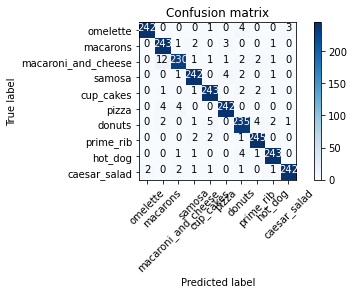

In [99]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from plotcm import plot_confusion_matrix

food_items = ["omelette", "macarons", "macaroni_and_cheese", "samosa", "cup_cakes", "pizza", "donuts", "prime_rib", "hot_dog", "caesar_salad"]

# Confusion matrix
conf_mat=confusion_matrix(lbllist.numpy(), predlist.numpy())
plot_confusion_matrix(conf_mat, food_items)
# print(conf_mat)
#ConfusionMatrixDisplay.from_predictions(lbllist.numpy(), predlist.numpy())

## Generate Saliency Maps for Visualization ##

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


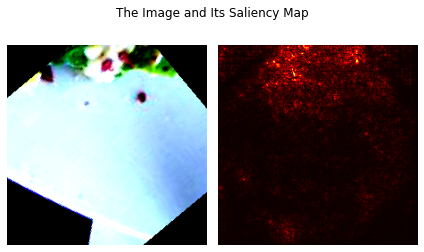

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


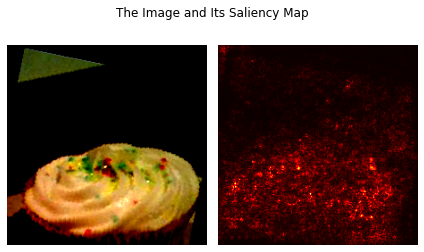

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


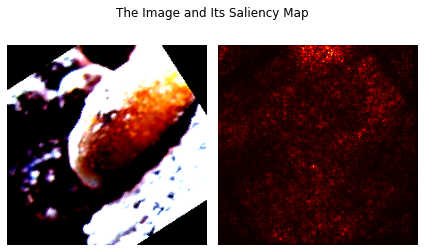

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


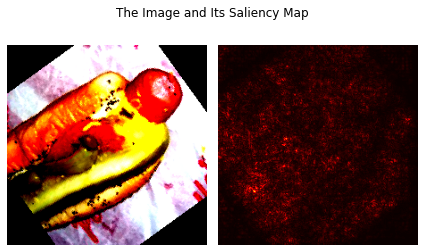

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


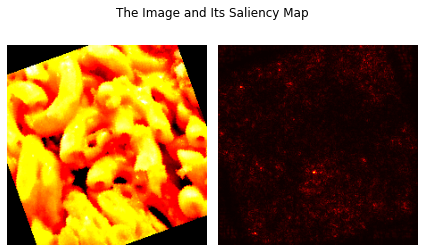

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


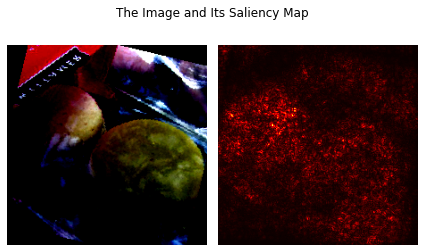

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


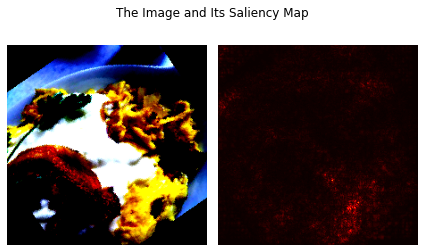

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


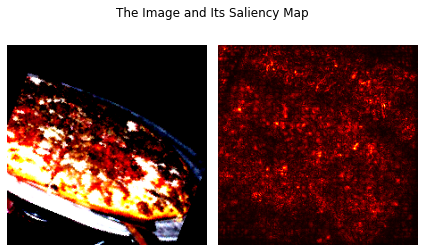

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


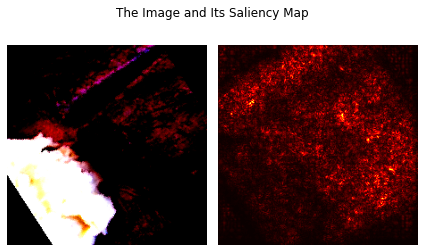

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


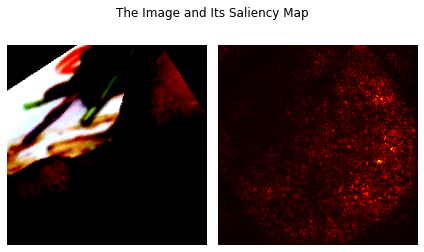

In [32]:
from torchvision import transforms
from PIL import Image

# Create list of class names
classes = sorted(["omelette", "macarons", "macaroni_and_cheese", "samosa", "cup_cakes", "pizza", "donuts", "prime_rib", "hot_dog", "caesar_salad"])

# track test loss
test_loss = 0.0
class_correct = list(0. for i in range(len(classes)))
class_total = list(0. for i in range(len(classes)))

#move model to gpu
model.cuda()
model.eval()

# Data augmentation
transform_ = transforms.Compose([transforms.RandomResizedCrop(224),
                                       transforms.RandomHorizontalFlip(),
                                       transforms.RandomRotation(45),
                                       transforms.ColorJitter(),
                                       transforms.ToTensor(),
                                       transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                            std=[0.229, 0.224, 0.225])])

#Generate the saliency map for one random image from every class
fig.suptitle("Showing one random image from each class of food item", y=1.05, fontsize=40)
data_dir = "food-101/images/"
foods_sorted = sorted(food_items)
food_id = 0
for i in range(len(classes)):
#   for j in range(cols):
    try:
      food_selected = foods_sorted[food_id] 
      food_id += 1
    except:
      break
    food_selected_images = os.listdir(os.path.join(data_dir,food_selected))
    food_selected_random = np.random.choice(food_selected_images)
    img = Image.open(os.path.join(data_dir,food_selected, food_selected_random))
    
    # Transforms the image
    image = transform_(img)
    
    # Reshape the image (because the model use 
    # 4-dimensional tensor (batch_size, channel, width, height))
    image = image.reshape(1, 3, 224, 224)
    
    # Set the device for the image
    image = image.cuda()
    
    # Set the requires_grad_ to the image for retrieving gradients
    image.requires_grad_()
    
    # Retrieve output from the image
    output = model(image)

    # Catch the output
    output_idx = output.argmax()
    output_max = output[0, output_idx]

    # Do backpropagation to get the derivative of the output based on the image
    output_max.backward()
    
    # Retrieve the saliency map and also pick the maximum value from channels on each pixel.
    # In this case, we look at dim=1. Recall the shape (batch_size, channel, width, height)
    saliency, _ = torch.max(image.grad.data.abs(), dim=1) 
    saliency = saliency.reshape(224, 224)

    # Reshape the image
    image = image.reshape(-1, 224, 224)

    # Visualize the image and the saliency map
    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(image.cpu().detach().numpy().transpose(1, 2, 0))
    ax[0].axis('off')
    ax[1].imshow(saliency.cpu(), cmap='hot')
    ax[1].axis('off')
    plt.tight_layout()
    fig.suptitle('The Image and Its Saliency Map')
    plt.show()

